In [846]:
import numpy as np
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from cylib.qmtdata.cyxtdata import xtdata  
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import statsmodels.api as sm
from sklearn.decomposition import PCA
import seaborn as sns

## 函数

In [718]:
#同比(去掉前12个元素)
def yoy(df):
    df = df.pct_change(12).fillna(0).iloc[12:]
    return df

In [719]:
#环比(去掉前1个元素)
def mom(df):
    df = df.pct_change(1).fillna(0).iloc[1:]
    return df

In [720]:
#pca
def pca(dfyoy,type_name):
    data_array = dfyoy.to_numpy()
    data_array[np.isinf(data_array)] = 0
    pca_dfyoy = PCA(n_components=6)
    pca_dfyoy.fit(data_array)
    transformed_data = pca_dfyoy.transform(data_array)
    columns = [f'PCA{i+1}_{type_name}' for i in range(6)]
    pca_yoy_df = pd.DataFrame(transformed_data, index=dfyoy.index, columns=columns)
    return pca_yoy_df

In [721]:
#市场因子
def make_market_factor(df_st,df_in,df_de,df_gd):
    #同比
    styoy = yoy(df_st)
    inyoy = yoy(df_in)
    deyoy = yoy(df_de)
    gdyoy = yoy(df_gd)
    #pca
    pca_styoy_df = pca(styoy,'styoy')
    pca_inyoy_df = pca(inyoy,'inyoy')
    pca_deyoy_df = pca(deyoy,'deyoy')
    pca_gdyoy_df = pca(gdyoy,'gdyoy')
    pca_deyoy_df_10 = pca_deyoy_df*10 #10倍债券
    #市场因子(基于4个数据)
    market_factor = (pca_styoy_df['PCA1_styoy'] - pca_deyoy_df_10['PCA1_deyoy'] + (pca_gdyoy_df['PCA1_gdyoy']) + (pca_inyoy_df['PCA1_inyoy']))/4
    market_factor = pd.DataFrame(market_factor)
    return market_factor

In [722]:
#风格因子
def make_style_factor(df_st,df_in,df_de,df_gd):
    #同比
    styoy = yoy(df_st)
    inyoy = yoy(df_in)
    deyoy = yoy(df_de)
    gdyoy = yoy(df_gd)
    #pca
    pca_styoy_df = pca(styoy,'styoy')
    pca_inyoy_df = pca(inyoy,'inyoy')
    pca_deyoy_df = pca(deyoy,'deyoy')
    pca_gdyoy_df = pca(gdyoy,'gdyoy')
    pca_deyoy_df_10 = pca_deyoy_df*10 #10倍债券
    #风格因子(基于4个数据)
    style_factor = (pca_styoy_df['PCA2_styoy'] + pca_deyoy_df_10['PCA2_deyoy'] + (pca_gdyoy_df['PCA2_gdyoy']) + (pca_inyoy_df['PCA2_inyoy']))/4
    style_factor = pd.DataFrame(style_factor)
    return style_factor

In [723]:
#市场因子（时序）
def make_market_factor_time(time_list):
    global df_st_temp, df_in_temp, df_de_temp, df_gd_temp
    #删减第一行
    df_st_temp = df_st_temp.iloc[1:]#为函数外变量
    df_in_temp = df_in_temp.iloc[1:]
    df_de_temp = df_de_temp.iloc[1:]
    df_gd_temp = df_gd_temp.iloc[1:]
    #寻找time_list对应的数据
    stline = st_line_re(time_list)
    inline = in_line_re(time_list)
    deline = de_line_re(time_list)
    gdline = gd_line_re(time_list)
    #添加一行
    df_st_temp = df_st_temp.append(stline, ignore_index=False)
    df_in_temp = df_in_temp.append(inline, ignore_index=False)
    df_de_temp = df_de_temp.append(deline, ignore_index=False)
    df_gd_temp = df_gd_temp.append(gdline, ignore_index=False)
    #市场因子(基于4个数据)
    market_factor = make_market_factor(df_st_temp,df_in_temp,df_de_temp,df_gd_temp)
    market_factor = pd.DataFrame(market_factor)
    return market_factor

In [724]:
#风格因子（时序）
def make_style_factor_time(time_list):
    #风格因子(基于4个数据)
    global df_st_temp, df_in_temp, df_de_temp, df_gd_temp
    style_factor = make_style_factor(df_st_temp,df_in_temp,df_de_temp,df_gd_temp)
    style_factor = pd.DataFrame(style_factor)
    return style_factor

## 主函数

#### 基本数据（2006-08-23到2018-01-01）

In [725]:
start_date = '2006-08-23'
end_date = '2018-01-01'

In [726]:
#股票
st_path = '国内权益-股票综合指数.xlsx'
df_st = pd.read_excel(st_path, engine='openpyxl')
df_st.index = df_st['指标名称']
df_st = df_st.rename_axis('stocks', axis='index')
df_st = df_st.drop(df_st.columns[0], axis=1)
df_st = df_st[(df_st.index >= start_date) & (df_st.index <= end_date)]
#删除一些列
df_st = df_st.drop(df_st.columns[11], axis=1)
df_st = df_st.drop(df_st.columns[11], axis=1)
df_st = df_st.drop(df_st.columns[11], axis=1)
df_st = df_st.drop(df_st.columns[12], axis=1)
df_st = df_st.drop(df_st.columns[12], axis=1)
df_st = df_st.drop(df_st.columns[12], axis=1)
df_st = df_st[(df_st != 0).all(axis=1)]
df_st = df_st.iloc[::21]

In [727]:
#行业指数
in_path = '权益-股票.xlsx'
df_in = pd.read_excel(in_path, engine='openpyxl')
df_in.index = df_in['指标名称']
df_in = df_in.rename_axis('stocks', axis='index')
df_in = df_in.drop(df_in.columns[0], axis=1)
df_in = df_in.loc[df_st.index]

In [728]:
#债券
de_path = '债券1forPCA.xlsx'
df_de = pd.read_excel(de_path, engine='openpyxl')
df_de.index = df_de['Unnamed: 0']
df_de = df_de.drop(df_de.columns[0], axis=1)
df_de = df_de.loc[df_st.index]

In [729]:
#商品
gd_path = '南华商品指数.xlsx'
df_gd = pd.read_excel(gd_path, engine='openpyxl')
df_gd.index = df_gd['指标名称']
df_gd = df_gd.rename_axis('goods', axis='index')
df_gd = df_gd.drop(df_gd.columns[0], axis=1)
df_gd = df_gd.loc[df_st.index]
#删除一些数据
columns_to_drop = [col for col in df_gd.columns if df_gd[col].iloc[0] == 0]
df_gd = df_gd.drop(columns=columns_to_drop)

In [834]:
#累计库
df_st_temp = df_st.copy()
df_in_temp = df_in.copy()
df_de_temp = df_de.copy()
df_gd_temp = df_gd.copy()
df_st1 = df_st.reset_index()
df_in1 = df_in.reset_index()
df_de1 = df_de.reset_index()
df_gd1 = df_gd.reset_index()
df_all = df_st1.merge(df_in1, on='stocks', how='outer').merge(df_de1, on='stocks', how='outer').merge(df_gd1, on='stocks', how='outer')
df_all.index = df_all['stocks']
df_all = df_all.drop(df_all.columns[0], axis=1)
df_all_temp = df_all.copy()

In [835]:
#第一次的市场和风格因子
market_factor = make_market_factor(df_st,df_in,df_de,df_gd)
style_factor = make_style_factor(df_st,df_in,df_de,df_gd)

In [741]:
#回测时间20180101-20240814
start_date_re = '2018-01-14'
end_date_re = '2024-08-01'

### 2种信号（行业）

In [652]:
#回测行业指数
in_path_re = '权益-股票.xlsx'
df_in_re = pd.read_excel(in_path_re, engine='openpyxl')
df_in_re.index = df_in_re['指标名称']
df_in_re = df_in_re.rename_axis('stocks', axis='index')
df_in_re = df_in_re.drop(df_in_re.columns[0], axis=1)
df_in_re = df_in_re[(df_in_re.index >= start_date_re) & (df_in_re.index <= end_date_re)]
df_in_re = df_in_re.iloc[::21]

In [287]:
#累计库(回测)
df_in_re_temp = df_in_re.copy()

In [288]:
# (for_y.iloc[:,i] - (para[i]['β0'] + ((para[i]['β1，β2'])[0])*(market_factor.iloc[:,0]) + ((para[i]['β1，β2'])[1])*(style_factor.iloc[:,0]))).iloc[108:120]

#当前时间
cur_time = df_in_re.index[i]   #.strftime('%Y-%m-%d')
#线性回归
temp_data = df_in_re_temp
k=len(df_in_re.iloc[0])#行业指标数量
para = []
for i in range(k):
    X = pd.concat([market_factor, style_factor], axis=1)
    for_y = yoy(df_in_temp)
    y = for_y.iloc[:, i]
    model = LinearRegression()
    model.fit(X, y)
    y_pred = model.predict(X)
    coef = model.coef_
    intercept = model.intercept_
    para.append({'β1，β2': coef, 'β0': intercept})
#残差动量信号
deltas_list = []
for i in range(0,k):
    for j in range(108,120):
        delta = 0 
        y1= para[i]['β0'] + ((para[i]['β1，β2'])[0])*(market_factor.iloc[j,0]) + ((para[i]['β1，β2'])[1])*(style_factor.iloc[j,0])
        for_y = yoy(df_in_temp)
        y = (for_y.iloc[:,i])[j]
        delta = delta + (y - y1)
    deltas_list.append(delta)
#合并残差
deltas_all[deltas_all.shape[1]] = deltas_list

In [345]:
#残差动量信号

In [653]:
n = len(df_in_re)#时间（月）
deltas_all = pd.DataFrame()#每列代表一个是时间的残差（k(31)*n(76)）
for i in range(0,n):
    #当前时间
    cur_time = df_in_re.index[i]   #.strftime('%Y-%m-%d')
    #线性回归
    k=len(df_in_re.iloc[0])#行业指标数量
    para = []
    for i in range(k):
        X = pd.concat([market_factor, style_factor], axis=1)
        for_y = yoy(df_in_temp)
        y = for_y.iloc[:, i]
        model = LinearRegression()
        model.fit(X, y)
        y_pred = model.predict(X)
        coef = model.coef_
        intercept = model.intercept_
        para.append({'β1，β2': coef, 'β0': intercept})
    #残差动量信号
    deltas_list = []
    for i in range(0,k):
        delta = 0
        for j in range(108,120):
            y1= para[i]['β0'] + ((para[i]['β1，β2'])[0])*(market_factor.iloc[j,0]) + ((para[i]['β1，β2'])[1])*(style_factor.iloc[j,0])
            for_y = yoy(df_in_temp)
            y = (for_y.iloc[:,i])[j]
            delta = delta + (y - y1)
        deltas_list.append(delta)
    #合并残差
    deltas_all[deltas_all.shape[1]] = deltas_list
    #对每列排序（？没有考虑正负，绝对值排序）
    sorted_indices = deltas_all.apply(lambda x: x.sort_values(ascending=False).index)
    #获得新一期市场和风格因子(必须要先市场后风格)(第一次数值已近在前面计算过了)(每次都要重启一下累计库)
    market_factor = make_market_factor_time(cur_time) #函数外变量
    style_factor = make_style_factor_time(cur_time)
    #还有新一期累计库数据（在市场因子中已近更新）

In [654]:
#风格趋势信号

In [655]:
n = len(df_in_re)#时间（月）
deltas_all_trend = pd.DataFrame()#每列代表一个是时间的残差（k(31)*n(76)）
for i in range(0,n):
    #当前时间
    cur_time = df_in_re.index[i]   #.strftime('%Y-%m-%d')
    #线性回归
    k=len(df_in_re.iloc[0])#行业指标数量
    para = []
    for i in range(k):
        X = pd.concat([market_factor, style_factor], axis=1)
        for_y = yoy(df_in_temp)
        y = for_y.iloc[:, i]
        model = LinearRegression()
        model.fit(X, y)
        y_pred = model.predict(X)
        coef = model.coef_
        intercept = model.intercept_
        para.append({'β1，β2': coef, 'β0': intercept})
    #风格趋势信号
    deltas_list_trend = []
    for i in range(0,k):
        cycle, trend = sm.tsa.filters.hpfilter(style_factor, lamb=1600)
        delta = trend[119]*para[i]['β1，β2'][1]
        deltas_list_trend.append(delta)
    #合并残差
    deltas_all_trend[deltas_all_trend.shape[1]] = deltas_list_trend
    #对每列排序（？没有考虑正负，绝对值排序）
    sorted_indices_trend = deltas_all_trend.apply(lambda x: x.sort_values(ascending=False).index)
    #获得新一期市场和风格因子(必须要先市场后风格)(第一次数值已近在前面计算过了)(每次都要重启一下累计库)
    market_factor = make_market_factor_time(cur_time) #函数外变量
    style_factor = make_style_factor_time(cur_time)
    #还有新一期累计库数据（在市场因子中已近更新）

In [656]:
#回测区间环比
in_rate_base = df_in_re
in_rate_base = in_rate_base.pct_change().fillna(0)

In [657]:
#(1+df_in_re.pct_change().dropna()).cumprod().mean(axis = 1).plot()

In [658]:
#基准
profit = pd.DataFrame(index=in_rate_base.index)
for i in range(0,k):
    if profit.empty:
        profit = in_rate_base.iloc[:, i]
    else:
        profit = in_rate_base.iloc[:, i] + profit
profit = profit*(1/k)

mean return-0.000820477987777592
annual_ret-0.009845735853331105
SR-0.04945113409521936


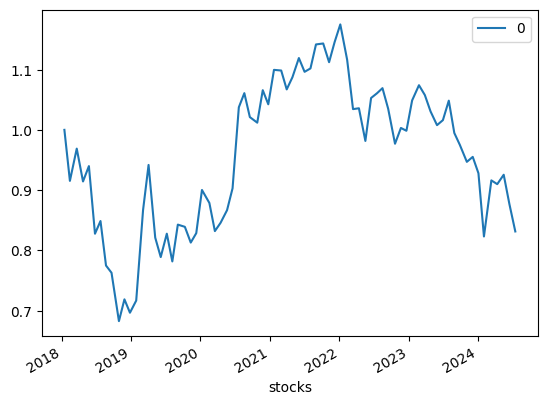

In [659]:
#数值
temp = pd.DataFrame(1+profit)
temp.index = pd.to_datetime(temp.index)
temp.cumprod().plot()
print(f'mean return{profit.mean()}')
print(f'annual_ret{profit.mean()*12}')
print(f'SR{(profit.mean()*12)/(profit.std()*np.sqrt(12))}')

In [662]:
#基于残差动量
profit1 = []
for month in range(0,n):
    #看多
    sig1_up= sorted_indices.iloc[:,month].sort_values().index[:10]
    profit1_up = 0
    for i in sig1_up:
        profit1_up = in_rate_base.iloc[month,:][i] + profit1_up               #回测的i月第i个数据
    profit1_up = profit1_up/10
    #看空
    sig1_low= sorted_indices.iloc[:,month].sort_values().index[-10:]
    profit1_low = 0
    for i in sig1_low:
        profit1_low = in_rate_base.iloc[month,:][i] + profit1_low               #回测的i月第i个数据
    profit1_low = profit1_low/10
    #综合
    profit1.append(profit1_up*(1/2) - profit1_low*(1/2))
profit1 = pd.DataFrame(profit1)

mean return0   -0.00068
dtype: float64
annual_ret0   -0.008156
dtype: float64
SR0   -0.206869
dtype: float64


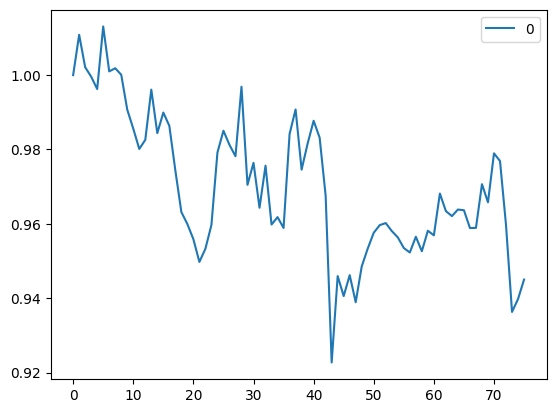

In [661]:
#数值
temp = pd.DataFrame(1+profit1)
# temp.index = pd.to_datetime(temp.index)
temp.cumprod().plot()
print(f'mean return{profit1.mean()}')
print(f'annual_ret{profit1.mean()*12}')
print(f'SR{(profit1.mean()*12)/(profit1.std()*np.sqrt(12))}')

In [663]:
#风格趋势信号
profit2 = []
for month in range(0,n):
    #看多
    sig2_up= sorted_indices_trend.iloc[:,month].sort_values().index[:10]
    profit2_up = 0
    for i in sig2_up:
        profit2_up = in_rate_base.iloc[month,:][i] + profit2_up               #回测的i月第i个数据
    profit2_up = profit2_up/10
    #看空
    sig2_low= sorted_indices_trend.iloc[:,month].sort_values().index[-10:]
    profit2_low = 0
    for i in sig2_low:
        profit2_low = in_rate_base.iloc[month,:][i] + profit2_low               #回测的i月第i个数据
    profit2_low = profit2_low/10
    #综合
    profit2.append(profit2_up*(1/2) - profit2_low*(1/2))
profit2 = pd.DataFrame(profit2)

mean return0    0.001203
dtype: float64
annual_ret0    0.014431
dtype: float64
SR0    0.380645
dtype: float64


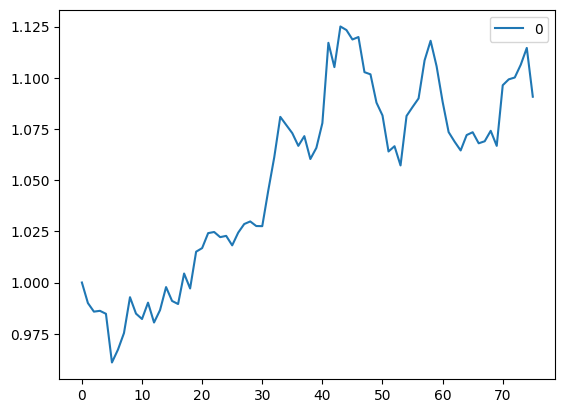

In [664]:
#数值
temp = pd.DataFrame(1+profit2)
# temp.index = pd.to_datetime(temp.index)
temp.cumprod().plot()
print(f'mean return{profit2.mean()}')
print(f'annual_ret{profit2.mean()*12}')
print(f'SR{(profit2.mean()*12)/(profit2.std()*np.sqrt(12))}')

### 双因子定价(全部)

In [796]:
#基于df_st_re获得对应time_list一行的数值的def

In [736]:
def st_line_re(time_list):
    x = df_st_re[(df_st_re.index == time_list)]
    return x

In [737]:
def in_line_re(time_list):
    x = df_in_re[(df_in_re.index == time_list)]
    return x

In [738]:
def de_line_re(time_list):
    x = df_de_re[(df_de_re.index == time_list)]
    return x

In [739]:
def gd_line_re(time_list):
    x = df_gd_re[(df_gd_re.index == time_list)]
    return x

In [740]:
def all_line_re(time_list):
    x = df_all_re[(df_all_re.index == time_list)]
    return x

In [567]:
#回测所有数据组合

In [731]:
#股票
st_path_re = '国内权益-股票综合指数.xlsx'
df_st_re = pd.read_excel(st_path_re, engine='openpyxl')
df_st_re.index = df_st_re['指标名称']
df_st_re = df_st_re.rename_axis('stocks', axis='index')
df_st_re = df_st_re.drop(df_st_re.columns[0], axis=1)
df_st_re = df_st_re[(df_st_re.index >= start_date_re) & (df_st_re.index <= end_date_re)]
#删除一些列
df_st_re = df_st_re.drop(df_st_re.columns[11], axis=1)
df_st_re = df_st_re.drop(df_st_re.columns[11], axis=1)
df_st_re = df_st_re.drop(df_st_re.columns[11], axis=1)
df_st_re = df_st_re.drop(df_st_re.columns[12], axis=1)
df_st_re = df_st_re.drop(df_st_re.columns[12], axis=1)
df_st_re = df_st_re.drop(df_st_re.columns[12], axis=1)
df_st_re = df_st_re[(df_st_re != 0).all(axis=1)]
df_st_re = df_st_re.iloc[::21]

In [732]:
#回测行业指数
in_path_re = '权益-股票.xlsx'
df_in_re = pd.read_excel(in_path_re, engine='openpyxl')
df_in_re.index = df_in_re['指标名称']
df_in_re = df_in_re.rename_axis('stocks', axis='index')
df_in_re = df_in_re.drop(df_in_re.columns[0], axis=1)
df_in_re = df_in_re[(df_in_re.index >= start_date_re) & (df_in_re.index <= end_date_re)]
df_in_re = df_in_re.iloc[::21]

In [733]:
#债券
de_path_re = '债券1forPCA.xlsx'
df_de_re = pd.read_excel(de_path_re, engine='openpyxl')
df_de_re.index = df_de_re['Unnamed: 0']
df_de_re = df_de_re.drop(df_de_re.columns[0], axis=1)
df_de_re = df_de_re.loc[df_st_re.index]

In [734]:
#商品
gd_path_re = '南华商品指数.xlsx'
df_gd_re = pd.read_excel(gd_path_re, engine='openpyxl')
df_gd_re.index = df_gd_re['指标名称']
df_gd_re = df_gd_re.rename_axis('goods', axis='index')
df_gd_re = df_gd_re.drop(df_gd_re.columns[0], axis=1)
df_gd_re1 = df_gd_re.loc[df_st.index] #要删除的，基于前面的2006为0
df_gd_re = df_gd_re.loc[df_st_re.index]
#删除一些数据
columns_to_drop = [col for col in df_gd_re1.columns if df_gd_re1[col].iloc[0] == 0]
df_gd_re = df_gd_re.drop(columns=columns_to_drop)

In [735]:
#所有
df_st_re1 = df_st_re.reset_index()
df_in_re1 = df_in_re.reset_index()
df_de_re1 = df_de_re.reset_index()
df_gd_re1 = df_gd_re.reset_index()
df_all_re = df_st_re1.merge(df_in_re1, on='stocks', how='outer').merge(df_de_re1, on='stocks', how='outer').merge(df_gd_re1, on='stocks', how='outer')
df_all_re.index = df_all_re['stocks']
df_all_re = df_all_re.drop(df_all_re.columns[0], axis=1)

#### 热力图分析

In [823]:
#！！！每次都要重新运行累计库和因子初始化

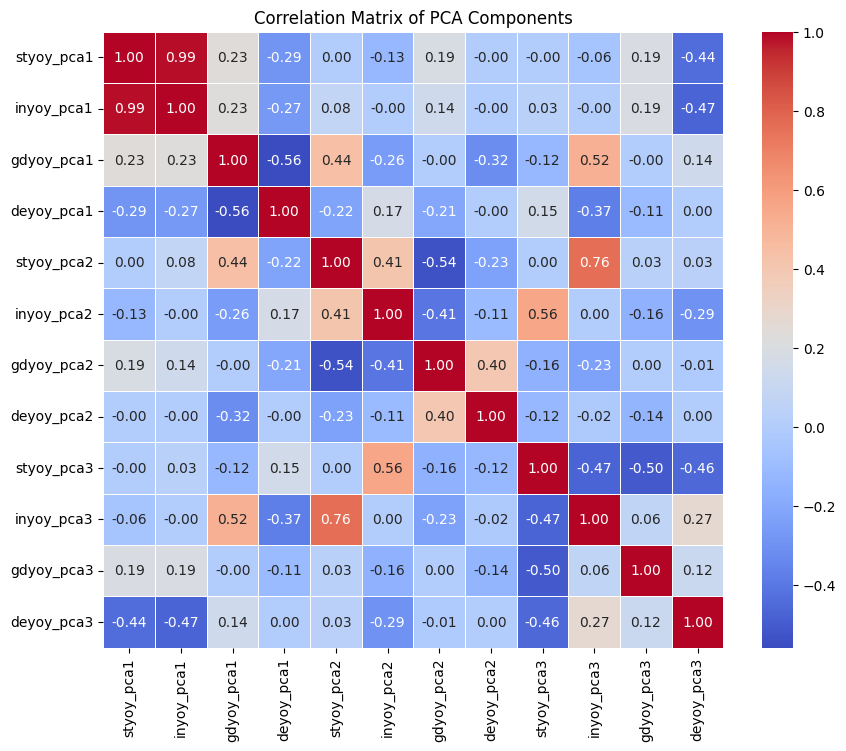

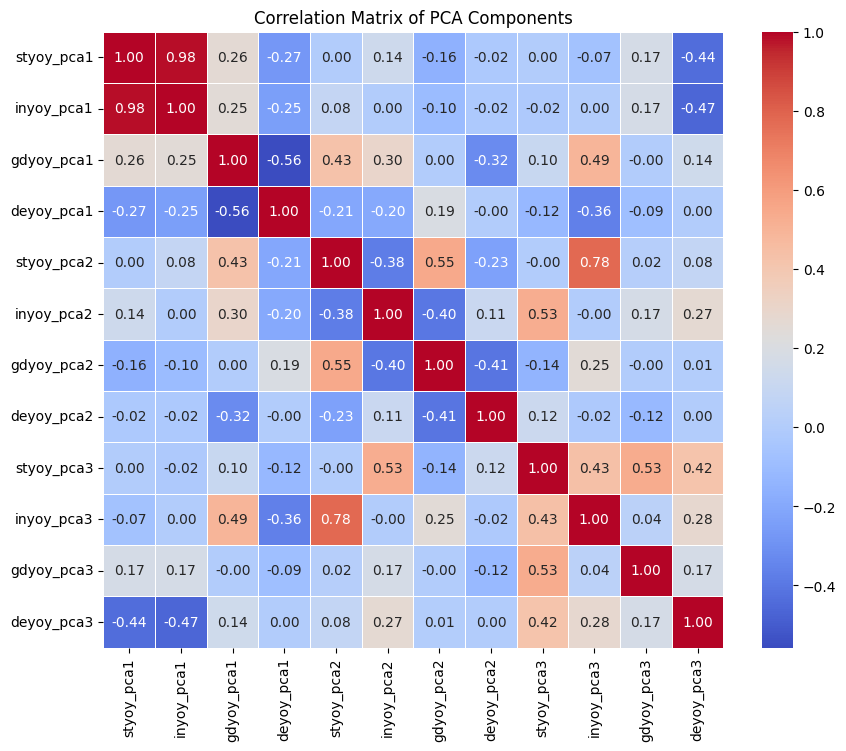

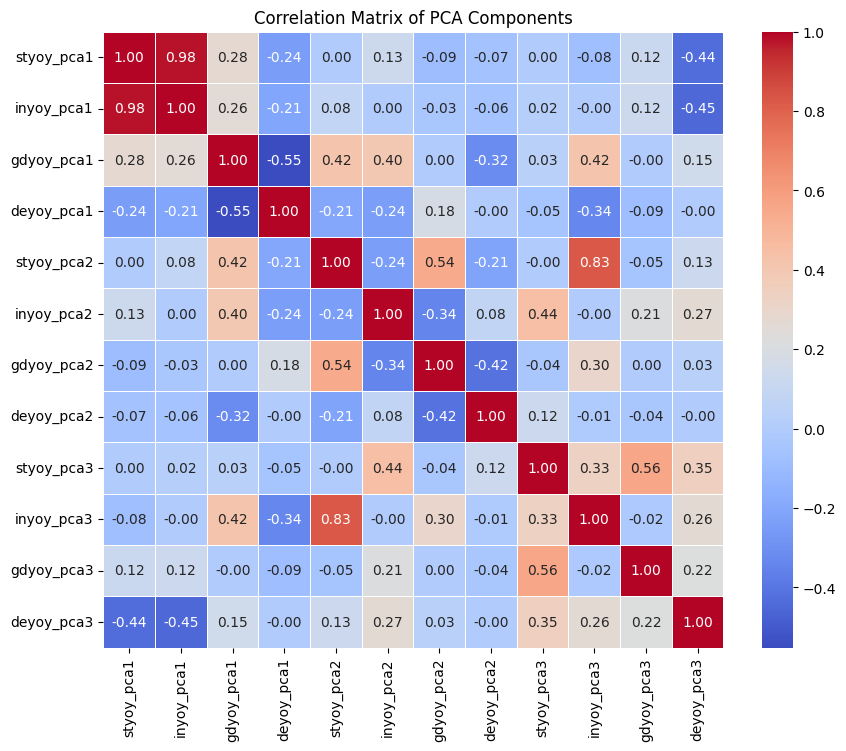

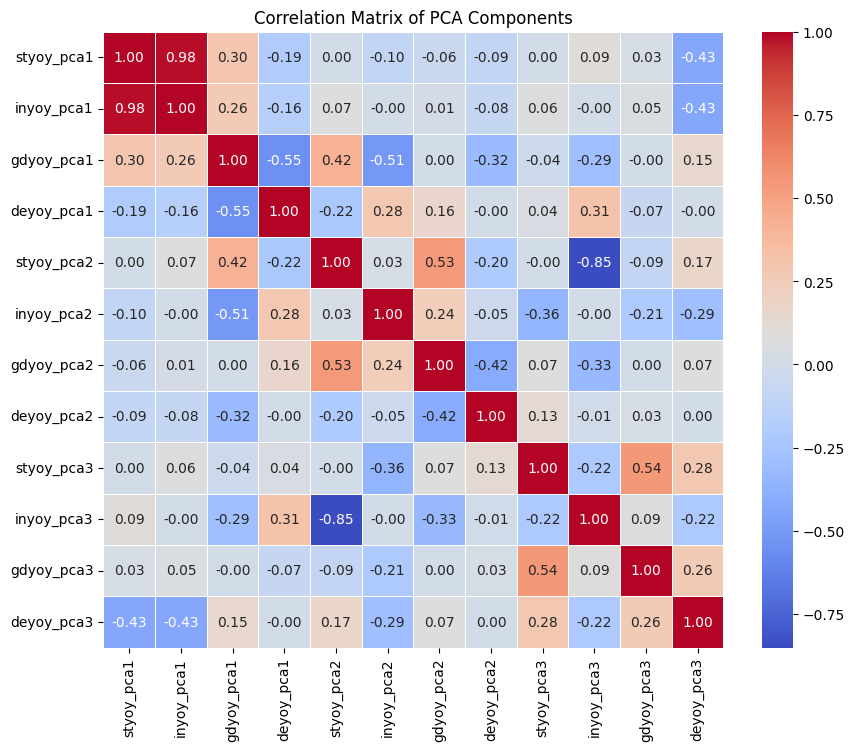

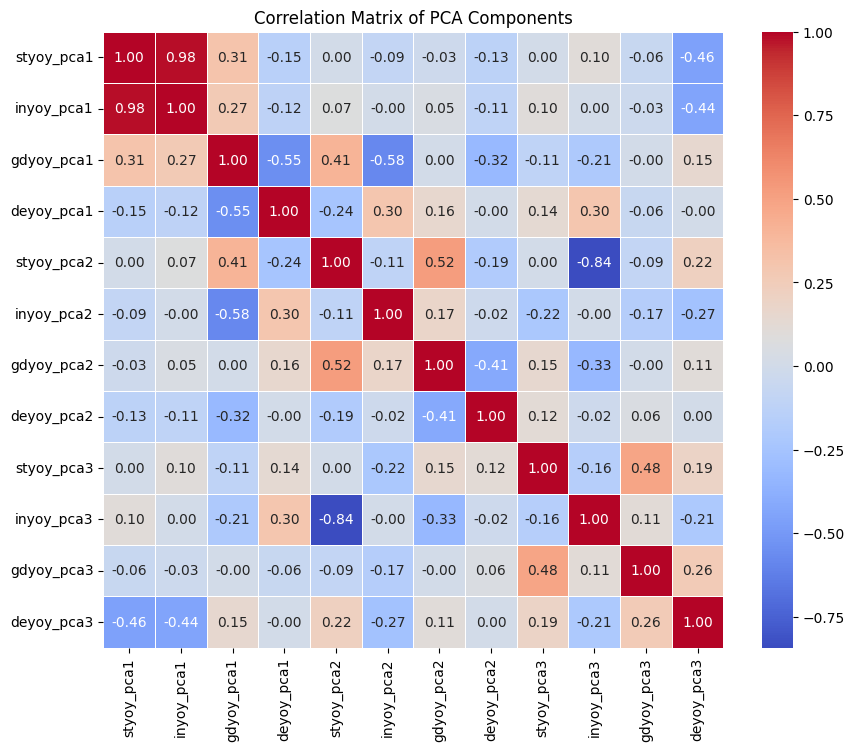

...

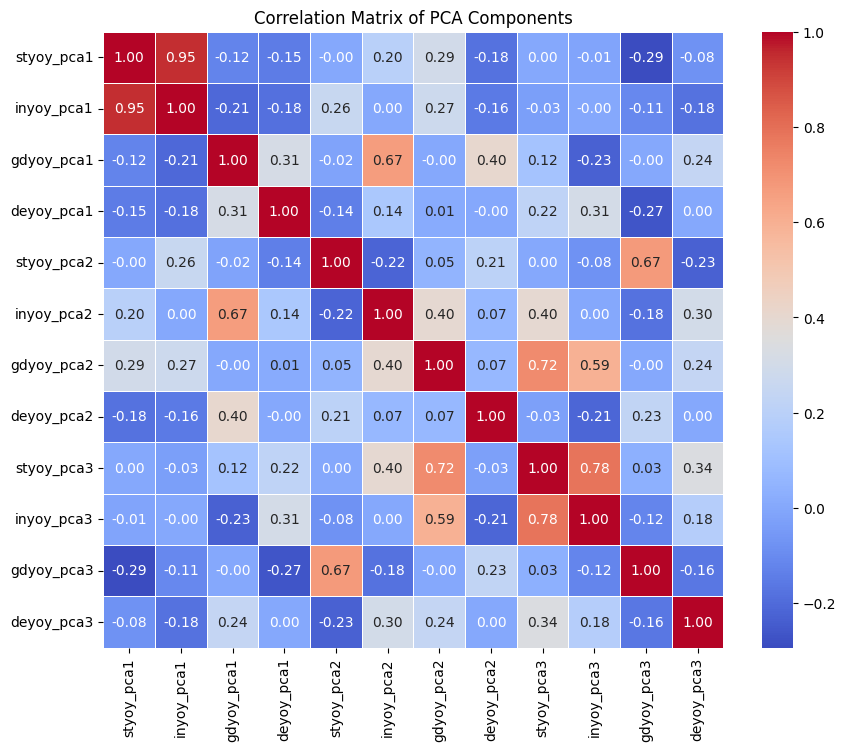

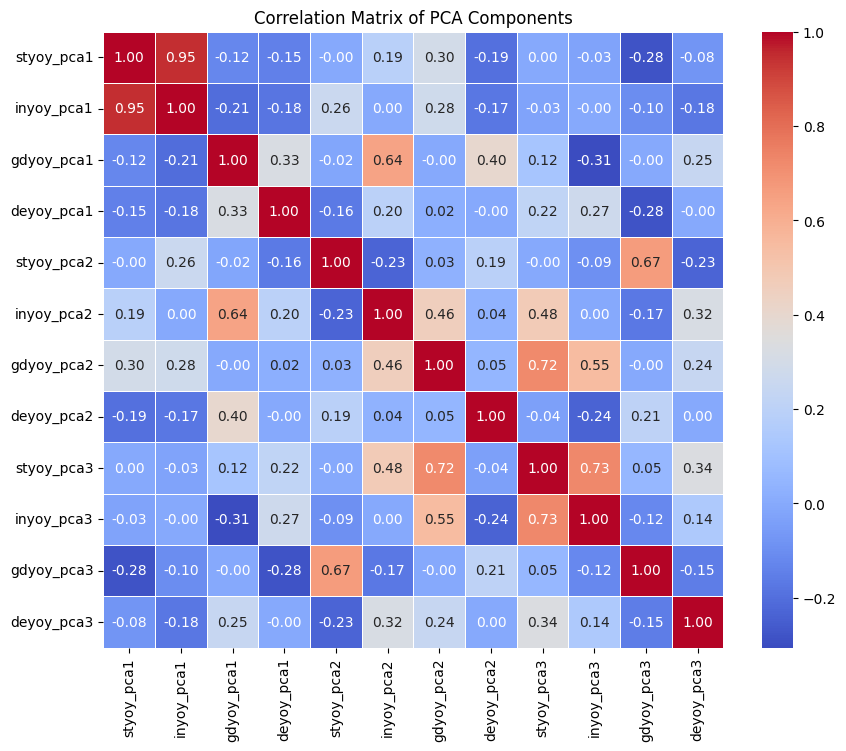

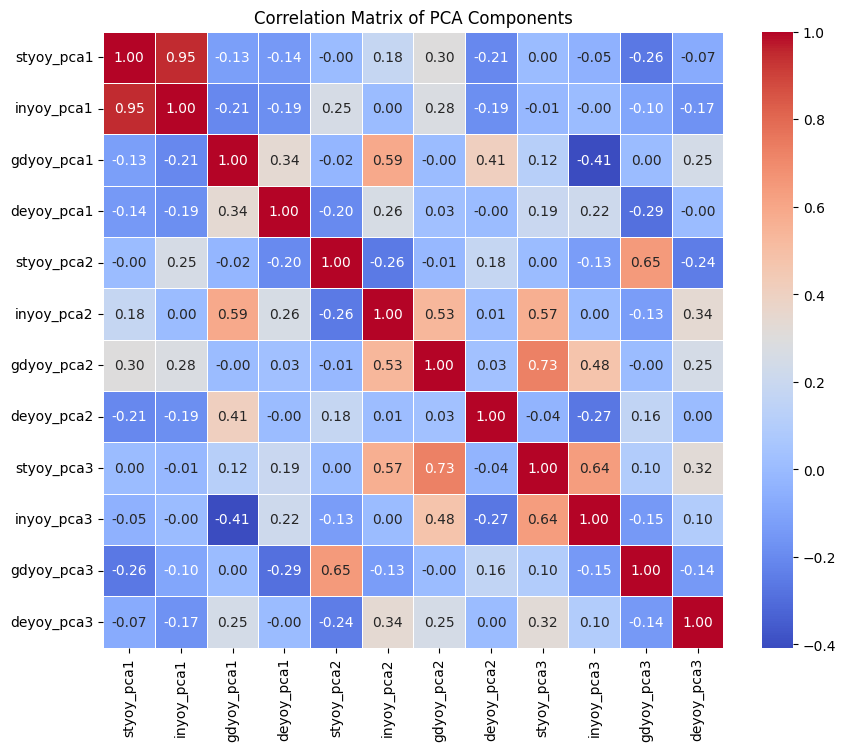

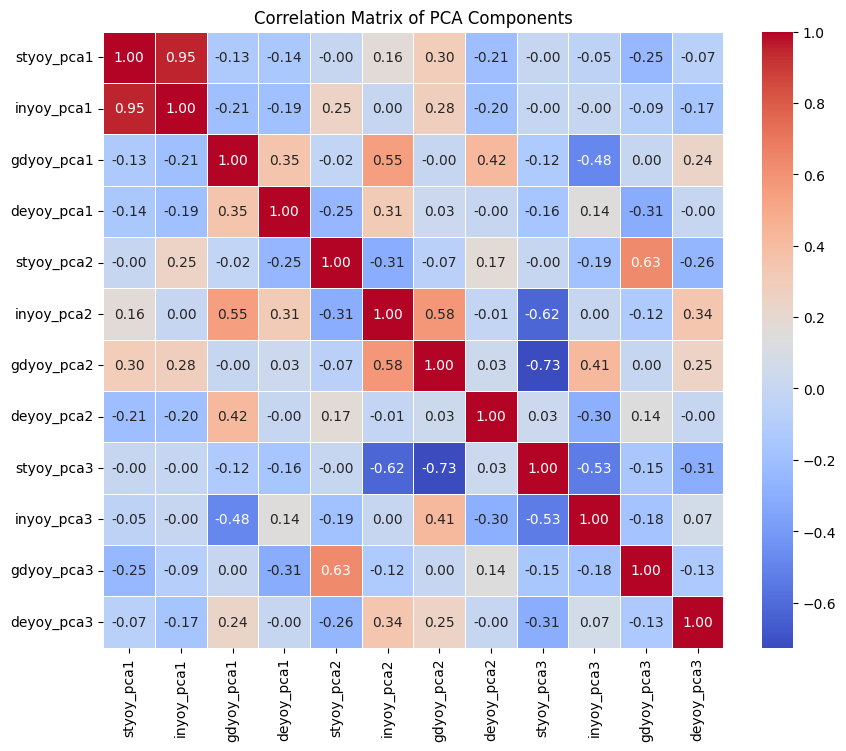

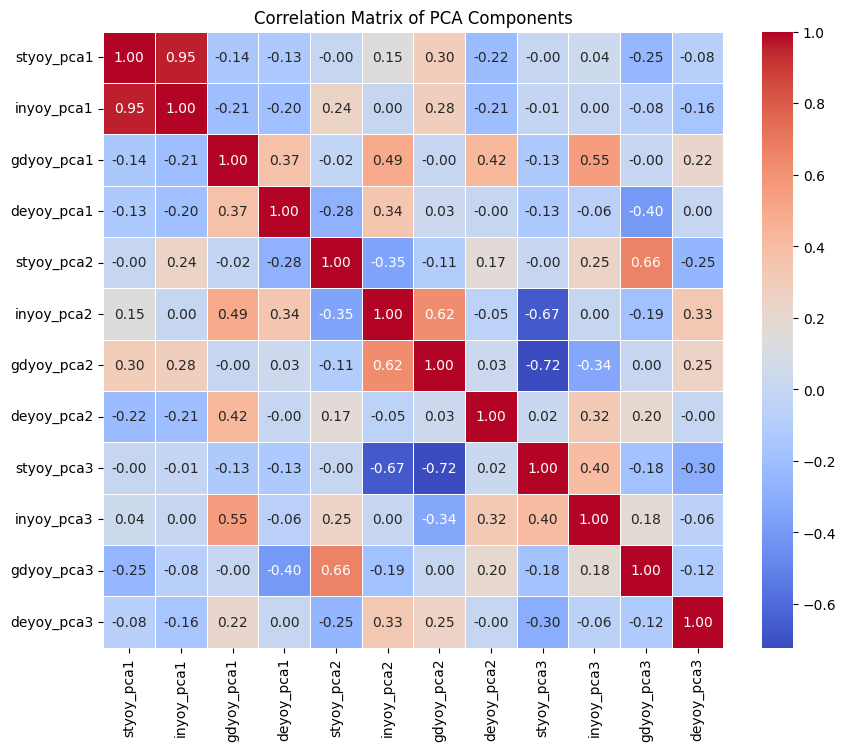

In [832]:
n = len(df_all_re)#时间（月）
deltas_all = pd.DataFrame()#每列代表一个是时间的残差（k(31)*n(76)）
for i in range(0,n):
    #当前时间
    cur_time = df_all_re.index[i]   #.strftime('%Y-%m-%d')
    #处理数据
    pca_styoy_df = pca(yoy(df_st_temp),'styoy')
    pca_inyoy_df = pca(yoy(df_in_temp),'inyoy')
    pca_gdyoy_df = pca(yoy(df_gd_temp),'gdyoy')
    pca_deyoy_df = pca(yoy(df_de_temp),'deyoy')
    pca_data = {
        'styoy': pca_styoy_df.iloc[:, :3],
        'inyoy': pca_inyoy_df.iloc[:, :3],
        'gdyoy': pca_gdyoy_df.iloc[:, :3],
        'deyoy': pca_deyoy_df.iloc[:, :3]
    }  
    #图
    pca_components = pd.DataFrame()
    for i in range(1, 4):  # 假设取前三个主成分
        for asset, df in pca_data.items():
            col_name = f'{asset}_pca{i}'
            pca_components[col_name] = df[f'PCA{i}_{asset}']
    corr_matrix = pca_components.corr()    # 计算相关系数矩阵
    plt.figure(figsize=(10, 8))    # 绘制热力图
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
    plt.title('Correlation Matrix of PCA Components')
    plt.show()
    
    
    #获得新一期市场和风格因子(必须要先市场后风格)(第一次数值已近在前面计算过了)(每次都要重启一下累计库)
    market_factor = make_market_factor_time(cur_time) #函数外变量
    style_factor = make_style_factor_time(cur_time)
    #还有新一期累计库数据（在市场因子中已近更新,df_all_temp单独运行）

#### 2种信号（all）

In [594]:
#残差动量信号

In [ ]:
#！！！每次都要重新运行累计库和因子初始化

In [810]:
n = len(df_all_re)#时间（月）
deltas_all = pd.DataFrame()#每列代表一个是时间的残差（k(31)*n(76)）
for i in range(0,n):
    #当前时间
    cur_time = df_all_re.index[i]   #.strftime('%Y-%m-%d')
    #线性回归
    k=len(df_all_re.iloc[0])#行业指标数量
    para = []
    for i in range(k):
        X = pd.concat([market_factor, style_factor], axis=1)
        for_y = yoy(df_all_temp)
        y = for_y.iloc[:, i]
        model = LinearRegression()
        model.fit(X, y)
        y_pred = model.predict(X)
        coef = model.coef_
        intercept = model.intercept_
        para.append({'β1，β2': coef, 'β0': intercept})
    #残差动量信号
    deltas_list = []
    for i in range(0,k):
        delta = 0
        for j in range(108,120):
            y1= para[i]['β0'] + ((para[i]['β1，β2'])[0])*(market_factor.iloc[j,0]) + ((para[i]['β1，β2'])[1])*(style_factor.iloc[j,0])
            for_y = yoy(df_all_temp)
            y = (for_y.iloc[:,i])[j]
            delta = delta + (y - y1)
        deltas_list.append(delta)
    #合并残差
    deltas_all[deltas_all.shape[1]] = deltas_list
    #对每列排序（？没有考虑正负，绝对值排序）
    sorted_indices = deltas_all.apply(lambda x: x.sort_values(ascending=False).index)
    #获得新一期市场和风格因子(必须要先市场后风格)(第一次数值已近在前面计算过了)(每次都要重启一下累计库)
    market_factor = make_market_factor_time(cur_time) #函数外变量
    style_factor = make_style_factor_time(cur_time)
    #还有新一期累计库数据（在市场因子中已近更新,df_all_temp单独运行）
    df_all_temp = df_all_temp.iloc[1:]
    allline = all_line_re(cur_time)
    df_all_temp = df_all_temp.append(allline, ignore_index=False)

In [745]:
#风格趋势信号

In [ ]:
#！！！每次都要重新运行累计库和因子初始化

In [836]:
n = len(df_all_re)#时间（月）
deltas_all_trend = pd.DataFrame()#每列代表一个是时间的残差（k(31)*n(76)）
for i in range(0,n):
    #当前时间
    cur_time = df_all_re.index[i]   #.strftime('%Y-%m-%d')
    #线性回归
    k=len(df_all_re.iloc[0])#行业指标数量
    para = []
    for i in range(k):
        X = pd.concat([market_factor, style_factor], axis=1)
        for_y = yoy(df_all_temp)
        y = for_y.iloc[:, i]
        model = LinearRegression()
        model.fit(X, y)
        y_pred = model.predict(X)
        coef = model.coef_
        intercept = model.intercept_
        para.append({'β1，β2': coef, 'β0': intercept})
    #风格趋势信号
    deltas_list_trend = []
    for i in range(0,k):
        cycle, trend = sm.tsa.filters.hpfilter(style_factor, lamb=1600)
        delta = trend[119]*para[i]['β1，β2'][1]
        deltas_list_trend.append(delta)
    #合并残差
    deltas_all_trend[deltas_all_trend.shape[1]] = deltas_list_trend
    #对每列排序（？没有考虑正负，绝对值排序）
    sorted_indices_trend = deltas_all_trend.apply(lambda x: x.sort_values(ascending=False).index)
    #获得新一期市场和风格因子(必须要先市场后风格)(第一次数值已近在前面计算过了)(每次都要重启一下累计库)
    market_factor = make_market_factor_time(cur_time) #函数外变量
    style_factor = make_style_factor_time(cur_time)
    #还有新一期累计库数据（在市场因子中已近更新）
    df_all_temp = df_all_temp.iloc[1:]
    allline = all_line_re(cur_time)
    df_all_temp = df_all_temp.append(allline, ignore_index=False)

In [747]:
#回测区间环比
all_rate_base = df_all_re
all_rate_base = all_rate_base.pct_change().fillna(0)

In [792]:
#1基准
profit = pd.DataFrame(index=all_rate_base.index)
for i in range(0,k):
    if profit.empty:
        profit = all_rate_base.iloc[:, i]
    else:
        profit = all_rate_base.iloc[:, i] + profit
profit = profit*(1/k)
profit.columns = ['rate']
profit.index = all_rate_base.index

mean return0.0013505397287281841
annual_ret0.01620647674473821
SR0.12451790167381573


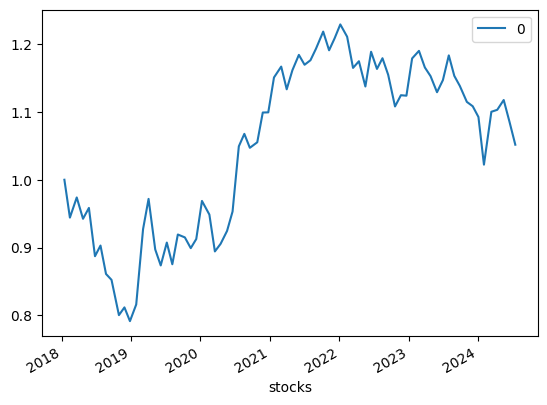

In [793]:
#数值
temp = pd.DataFrame(1+profit)
temp.index = pd.to_datetime(temp.index)
temp.cumprod().plot()
print(f'mean return{profit.mean()}')
print(f'annual_ret{profit.mean()*12}')
print(f'SR{(profit.mean()*12)/(profit.std()*np.sqrt(12))}')

In [811]:
#2基于残差动量
profit1 = []
for month in range(0,n):
    #看多
    sig1_up= sorted_indices.iloc[:,month].sort_values().index[:10]
    profit1_up = 0
    print(f'\n第{month+1}个月买涨资产为：')
    for i in sig1_up:
        profit1_up = all_rate_base.iloc[month,:][i] + profit1_up               #回测的i月第i个数据
        print(f'{all_rate_base.columns[i]}')
    profit1_up = profit1_up/10
    #看空
    sig1_low= sorted_indices.iloc[:,month].sort_values().index[-10:]
    profit1_low = 0
    print(f'\n第{month+1}个月做空资产为：')
    for i in sig1_low:
        profit1_low = all_rate_base.iloc[month,:][i] + profit1_low               #回测的i月第i个数据
        print(f'{all_rate_base.columns[i]}')
    profit1_low = profit1_low/10
    #综合
    profit1.append(profit1_up*(1/2) - profit1_low*(1/2))
profit1 = pd.DataFrame(profit1)
profit1.columns = ['rate']
profit1.index = all_rate_base.index


第1个月买涨资产为：
申万行业指数:电力设备
申万行业指数:建筑装饰
南华能化指数
申万行业指数:传媒
申万行业指数:国防军工
申万行业指数:综合
南华沪铝指数
南华沪铜指数
申万行业指数:通信
CBA00731

第1个月做空资产为：
深证成份B股指数
深证成份A股指数
深证综合指数
申万行业指数:非银金融
申万行业指数:食品饮料
沪深300指数
上证A股指数
深证100指数
上证B股指数
上证180指数

第2个月买涨资产为：
申万行业指数:电力设备
申万行业指数:建筑装饰
南华棉一指数
申万行业指数:机械设备
申万行业指数:综合
申万行业指数:轻工制造
CBA00651
CBA00661
申万行业指数:美容护理
CBA00751

第2个月做空资产为：
深证100指数
深证成份A股指数
深证成份B股指数
申万行业指数:国防军工
申万行业指数:交通运输
沪深300指数
上证A股指数
中证100指数
上证B股指数
上证50指数

第3个月买涨资产为：
申万行业指数:建筑材料
申万行业指数:综合
CBA00751
申万行业指数:社会服务
申万行业指数:房地产
申万行业指数:钢铁
CBA00621
CBA00631
申万行业指数:煤炭
南华沪铜指数

第3个月做空资产为：
深证100指数
深证成份B股指数
深证综合指数
申万行业指数:国防军工
申万行业指数:非银金融
沪深300指数
上证A股指数
中证100指数
上证B股指数
上证50指数

第4个月买涨资产为：
申万行业指数:房地产
申万行业指数:交通运输
南华沪铜指数
申万行业指数:建筑装饰
申万行业指数:综合
申万行业指数:纺织服饰
CBA00751
CBA00741
申万行业指数:汽车
CBA00731

第4个月做空资产为：
中证100指数
上证B股指数
深证成份指数
南华豆油指数
CBA00641
深证综合指数
上证综合指数
申万行业指数:商贸零售
上证50指数
深证成份B股指数

第5个月买涨资产为：
申万行业指数:轻工制造
申万行业指数:纺织服饰
南华沪铝指数
申万行业指数:公用事业
申万行业指数:食品饮料
深证100指数
CBA00651
CBA00641
申万行业指数:电子
CBA00731

第5个月做空资产为：
申万行业指数:社会服务
上证B股指数
上证180指数
南华豆油指数
CBA0074

mean returnrate    0.002297
dtype: float64
annual_retrate    0.027565
dtype: float64
SRrate    0.651066
dtype: float64


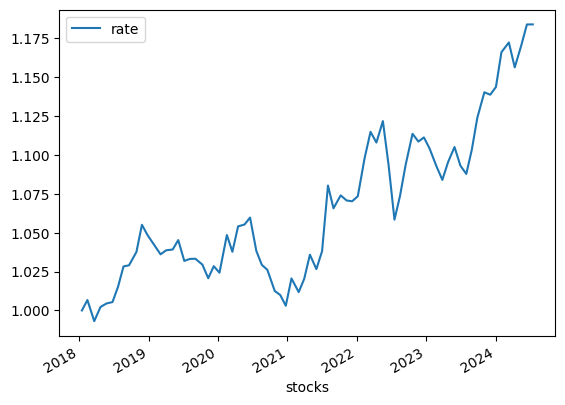

In [812]:
#数值
temp = pd.DataFrame(1+profit1)
# temp.index = pd.to_datetime(temp.index)
temp.cumprod().plot()
print(f'mean return{profit1.mean()}')
print(f'annual_ret{profit1.mean()*12}')
print(f'SR{(profit1.mean()*12)/(profit1.std()*np.sqrt(12))}')

In [837]:
#3风格趋势信号
profit2 = []
for month in range(0,n):
    #看多
    sig2_up= sorted_indices_trend.iloc[:,month].sort_values().index[:10]
    profit2_up = 0
    print(f'\n第{month+1}个月买涨资产为：')
    for i in sig2_up:
        profit2_up = all_rate_base.iloc[month,:][i] + profit2_up               #回测的i月第i个数据
        print(f'{all_rate_base.columns[i]}')
    profit2_up = profit2_up/10
    #看空
    sig2_low= sorted_indices_trend.iloc[:,month].sort_values().index[-10:]
    profit2_low = 0
    print(f'\n第{month+1}个月做空资产为：')
    for i in sig2_low:
        profit2_low = all_rate_base.iloc[month,:][i] + profit2_low               #回测的i月第i个数据
        print(f'{all_rate_base.columns[i]}')
    profit2_low = profit2_low/10
    #综合
    profit2.append(profit2_up*(1/2) - profit2_low*(1/2))
profit2 = pd.DataFrame(profit2)
profit2.columns = ['rate']
profit2.index = all_rate_base.index


第1个月买涨资产为：
申万行业指数:建筑装饰
申万行业指数:电力设备
申万行业指数:综合
申万行业指数:汽车
申万行业指数:食品饮料
上证180指数
深证成份A股指数
深证成份B股指数
CBA00741
南华天胶指数

第1个月做空资产为：
申万行业指数:有色金属
申万行业指数:建筑材料
申万行业指数:商贸零售
沪深300指数
申万行业指数:银行
深证综合指数
申万行业指数:公用事业
申万行业指数:轻工制造
申万行业指数:基础化工
中证100指数

第2个月买涨资产为：
CBA00721
CBA00731
申万行业指数:家用电器
申万行业指数:石油石化
CBA00631
申万行业指数:煤炭
申万行业指数:医药生物
申万行业指数:公用事业
申万行业指数:基础化工
南华豆粕指数

第2个月做空资产为：
沪深300指数
申万行业指数:商贸零售
申万行业指数:交通运输
深证成份A股指数
申万行业指数:轻工制造
深证成份B股指数
深证成份指数
中证100指数
上证180指数
深证综合指数

第3个月买涨资产为：
南华天胶指数
南华沪铝指数
申万行业指数:家用电器
申万行业指数:环保
CBA00651
CBA00631
申万行业指数:房地产
申万行业指数:建筑装饰
申万行业指数:基础化工
CBA00741

第3个月做空资产为：
沪深300指数
申万行业指数:公用事业
申万行业指数:医药生物
上证50指数
申万行业指数:纺织服饰
深证成份B股指数
深证成份A股指数
中证100指数
深证成份指数
深证综合指数

第4个月买涨资产为：
CBA00631
CBA00621
CBA00651
申万行业指数:家用电器
申万行业指数:电子
深证100指数
申万行业指数:食品饮料
申万行业指数:轻工制造
南华沪铝指数
南华沪铜指数

第4个月做空资产为：
CBA00641
申万行业指数:煤炭
申万行业指数:社会服务
上证50指数
申万行业指数:农林牧渔
上证B股指数
沪深300指数
申万行业指数:纺织服饰
上证180指数
深证成份A股指数

第5个月买涨资产为：
CBA00641
CBA00631
CBA00651
申万行业指数:食品饮料
申万行业指数:家用电器
中证100指数
申万行业指数:纺织服饰
申万行业指数:公用事业
CBA00741
南华天胶指数

第5个月做空资产为：
申万行业

mean returnrate   -0.001436
dtype: float64
annual_retrate   -0.017228
dtype: float64
SRrate   -0.235615
dtype: float64


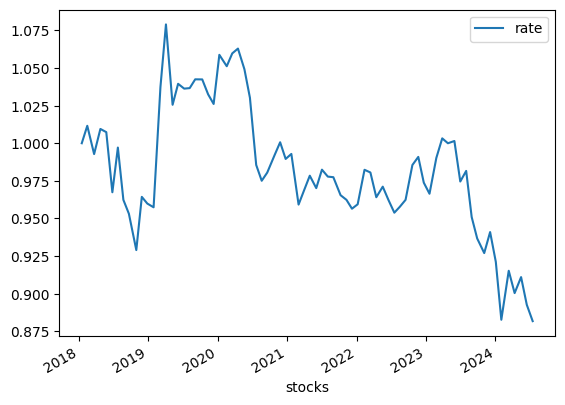

In [838]:
#数值
temp = pd.DataFrame(1+profit2)
# temp.index = pd.to_datetime(temp.index)
temp.cumprod().plot()
print(f'mean return{profit2.mean()}')
print(f'annual_ret{profit2.mean()*12}')
print(f'SR{(profit2.mean()*12)/(profit2.std()*np.sqrt(12))}')

#### 定价模型

In [760]:
#参数
rate = 4
num_st = 12
num_in = 31
num_de = 9
num_gd =16
num_all = 68
#n为回测多少个月，76

In [761]:
#1 基准

In [856]:
model_profit = []
for month in range(0,n):
    sum1 = (1/rate)*(1/num_st)*(all_rate_base.iloc[month,0:num_st].sum())
    sum2 = (1/rate)*(1/num_in)*(all_rate_base.iloc[month,num_st:num_in+num_st].sum())
    sum3 = (1/rate)*(1/num_st)*(all_rate_base.iloc[month,num_in+num_st:num_in+num_st+num_de].sum())
    sum4 = (1/rate)*(1/num_st)*(all_rate_base.iloc[month,num_in+num_st+num_de:num_in+num_st+num_de+num_gd].sum())
    sum_all = sum1 + sum2 + sum3 + sum4
    model_profit.append(sum_all)
model_profit = pd.DataFrame(model_profit)
model_profit.columns = ['rate']
model_profit.index = all_rate_base.index

mean returnrate    0.002238
dtype: float64
annual_retrate    0.026856
dtype: float64
SRrate    0.246376
dtype: float64


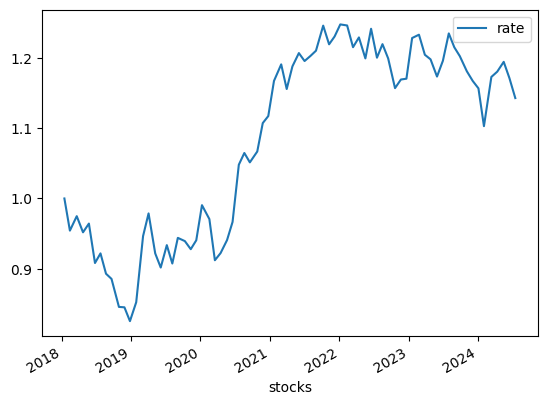

In [857]:
#数值
temp = pd.DataFrame(1+model_profit)
# temp.index = pd.to_datetime(temp.index)
temp.cumprod().plot()
print(f'mean return{model_profit.mean()}')
print(f'annual_ret{model_profit.mean()*12}')
print(f'SR{(model_profit.mean()*12)/(model_profit.std()*np.sqrt(12))}')

In [764]:
#2 残差动量+信号风险预算资产权重分配方式1

In [843]:
#quantity = 1

In [804]:
model_profit1 = []
for month in range(0,n):
    print(f'\n第{month+1}个月加仓资产为：')
    #up
    count_st_up = 0
    count_in_up = 0
    count_de_up = 0
    count_gd_up = 0
    sig_temp_up = sorted_indices.iloc[:,month].sort_values().index[:22]
    #统计在那个资产
    for num in sig_temp_up:
        print(f'{all_rate_base.columns[num]}')
        if(0<=num<=11):
            count_st_up = count_st_up + 1
        if(12<=num<=42):
            count_in_up = count_in_up + 1
        if(43<=num<=51):
            count_de_up = count_de_up + 1
        if(52<=num<=67):
            count_gd_up = count_gd_up + 1
    print(f'\n第{month+1}个月减仓资产为：')
    #low
    count_st_low = 0
    count_in_low = 0
    count_de_low = 0
    count_gd_low = 0
    sig_temp_low= sorted_indices.iloc[:,month].sort_values().index[-22:]
    #统计在那个资产
    for num in sig_temp_low:
        print(f'{all_rate_base.columns[num]}')
        if(0<=num<=11):
            count_st_low = count_st_low + 1
        if(12<=num<=42):
            count_in_low = count_in_low + 1
        if(43<=num<=51):
            count_de_low = count_de_low + 1
        if(52<=num<=67):
            count_gd_low = count_gd_low + 1
    quantity = 1 + (1/rate)*(1/num_st)*(2)*(count_st_up) - (1/rate)*(1/num_st)*(2/3)*(count_st_low) + (1/rate)*(1/num_in)*(2)*(count_in_up) - (1/rate)*(1/num_in)*(2/3)*(count_in_up) + (1/rate)*(1/num_de)*(2)*(count_de_up) - (1/rate)*(1/num_de)*(2/3)*(count_de_low) + (1/rate)*(1/num_gd)*(2)*(count_gd_up) - (1/rate)*(1/num_gd)*(2/3)*(count_gd_low)
    #字典
    row = all_rate_base.iloc[month,:]
    result_dict = {}
    for i, col in enumerate(all_rate_base.columns):
        value1 = row[col]
        if 0<=i<=11:
            value2 = 1/((rate)*(num_st))
        elif 12<=i<=42:
            value2 = 1/((rate)*(num_in))
        elif 43<=i<=51:
            value2 = 1/((rate)*(num_de))
        elif 52<=i<=67:
            value2 = 1/((rate)*(num_gd))
        result_dict[col] = {'value1': value1, 'value2': value2}
    #乘倍数
    keys_list = list(result_dict.keys())
    for up in sig_temp_up:
        value2_temp = result_dict[keys_list[up]]['value2']
        result_dict[keys_list[up]]['value2'] = 3*value2_temp
    for low in sig_temp_low:
        value2_temp = result_dict[keys_list[low]]['value2']
        result_dict[keys_list[low]]['value2'] = (1/3)*value2_temp
    for i in range(0,num_all):
        result_dict[keys_list[i]]['rate_change'] = result_dict[keys_list[i]]['value1']*result_dict[keys_list[i]]['value2']
    ans_rate_change = 0
    for i in range(0,num_all):
        ans_rate_change = result_dict[keys_list[i]]['rate_change'] + ans_rate_change
    ans_rate_change = ans_rate_change/quantity
    model_profit1.append(ans_rate_change)
model_profit1 = pd.DataFrame(model_profit1)
model_profit1.columns = ['rate']
model_profit1.index = all_rate_base.index


第1个月加仓资产为：
申万行业指数:电力设备
申万行业指数:建筑装饰
南华能化指数
申万行业指数:传媒
申万行业指数:国防军工
申万行业指数:综合
南华沪铝指数
南华沪铜指数
申万行业指数:通信
CBA00731
CBA00641
申万行业指数:机械设备
CBA00741
申万行业指数:计算机
申万行业指数:交通运输
南华玉米指数
申万行业指数:建筑材料
南华豆粕指数
申万行业指数:房地产
中证100指数
南华工业品指数
CBA00651

第1个月减仓资产为：
申万行业指数:医药生物
申万行业指数:社会服务
申万行业指数:钢铁
申万行业指数:家用电器
申万行业指数:轻工制造
申万行业指数:公用事业
申万行业指数:电子
申万行业指数:农林牧渔
上证50指数
深证成份指数
上证综合指数
申万行业指数:有色金属
深证成份B股指数
深证成份A股指数
深证综合指数
申万行业指数:非银金融
申万行业指数:食品饮料
沪深300指数
上证A股指数
深证100指数
上证B股指数
上证180指数

第2个月加仓资产为：
申万行业指数:电力设备
申万行业指数:建筑装饰
南华棉一指数
申万行业指数:机械设备
申万行业指数:综合
申万行业指数:轻工制造
CBA00651
CBA00661
申万行业指数:美容护理
CBA00751
申万行业指数:通信
申万行业指数:公用事业
南华沪燃油指数
申万行业指数:煤炭
申万行业指数:钢铁
CBA00741
申万行业指数:环保
南华郑糖指数
申万行业指数:社会服务
深证综合指数
南华金属指数
南华天胶指数

第2个月减仓资产为：
申万行业指数:医药生物
申万行业指数:非银金融
申万行业指数:基础化工
申万行业指数:汽车
申万行业指数:食品饮料
申万行业指数:商贸零售
申万行业指数:纺织服饰
申万行业指数:房地产
上证180指数
深证成份指数
上证综合指数
申万行业指数:电子
深证100指数
深证成份A股指数
深证成份B股指数
申万行业指数:国防军工
申万行业指数:交通运输
沪深300指数
上证A股指数
中证100指数
上证B股指数
上证50指数

第3个月加仓资产为：
申万行业指数:建筑材料
申万行业指数:综合
CBA00751
申万行业指数:社会服务
申万行业指数:房地产
申万行业指数:钢铁
CBA00621
CBA00631
申万行业指数:煤炭


mean returnrate    0.003271
dtype: float64
annual_retrate    0.039248
dtype: float64
SRrate    0.413562
dtype: float64


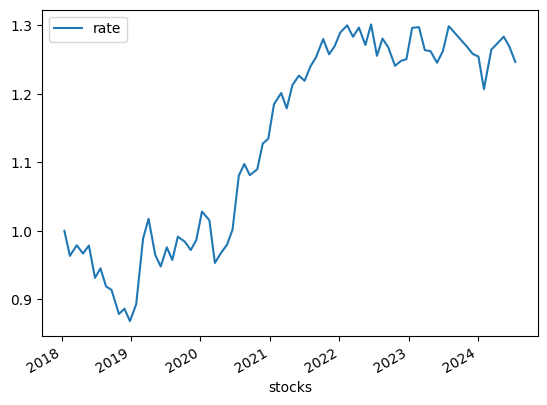

In [805]:
#数值
temp = pd.DataFrame(1+model_profit1)
# temp.index = pd.to_datetime(temp.index)
temp.cumprod().plot()
print(f'mean return{model_profit1.mean()}')
print(f'annual_ret{model_profit1.mean()*12}')
print(f'SR{(model_profit1.mean()*12)/(model_profit1.std()*np.sqrt(12))}')

In [806]:
#3 风格动量+信号风险预算资产权重分配方式1

In [839]:
model_profit2 = []
for month in range(0,n):
    print(f'\n第{month+1}个月加仓资产为：')
    #up
    count_st_up = 0
    count_in_up = 0
    count_de_up = 0
    count_gd_up = 0
    sig_temp_up= sorted_indices_trend.iloc[:,month].sort_values().index[:22]
    #统计在那个资产
    for num in sig_temp_up:
        print(f'{all_rate_base.columns[num]}')
        if(0<=num<=11):
            count_st_up = count_st_up + 1
        if(12<=num<=42):
            count_in_up = count_in_up + 1
        if(43<=num<=51):
            count_de_up = count_de_up + 1
        if(52<=num<=67):
            count_gd_up = count_gd_up + 1
    print(f'\n第{month+1}个月减仓资产为：')
    #low
    count_st_low = 0
    count_in_low = 0
    count_de_low = 0
    count_gd_low = 0
    sig_temp_low= sorted_indices_trend.iloc[:,month].sort_values().index[-22:]
    #统计在那个资产
    for num in sig_temp_low:
        print(f'{all_rate_base.columns[num]}')
        if(0<=num<=11):
            count_st_low = count_st_low + 1
        if(12<=num<=42):
            count_in_low = count_in_low + 1
        if(43<=num<=51):
            count_de_low = count_de_low + 1
        if(52<=num<=67):
            count_gd_low = count_gd_low + 1
    quantity = 1 + (1/rate)*(1/num_st)*(2)*(count_st_up) - (1/rate)*(1/num_st)*(2/3)*(count_st_low) + (1/rate)*(1/num_in)*(2)*(count_in_up) - (1/rate)*(1/num_in)*(2/3)*(count_in_up) + (1/rate)*(1/num_de)*(2)*(count_de_up) - (1/rate)*(1/num_de)*(2/3)*(count_de_low) + (1/rate)*(1/num_gd)*(2)*(count_gd_up) - (1/rate)*(1/num_gd)*(2/3)*(count_gd_low)
    #字典
    row = all_rate_base.iloc[month,:]
    result_dict = {}
    for i, col in enumerate(all_rate_base.columns):
        value1 = row[col]
        if 0<=i<=11:
            value2 = 1/((rate)*(num_st))
        elif 12<=i<=42:
            value2 = 1/((rate)*(num_in))
        elif 43<=i<=51:
            value2 = 1/((rate)*(num_de))
        elif 52<=i<=67:
            value2 = 1/((rate)*(num_gd))
        result_dict[col] = {'value1': value1, 'value2': value2}
    #乘倍数
    keys_list = list(result_dict.keys())
    for up in sig_temp_up:
        value2_temp = result_dict[keys_list[up]]['value2']
        result_dict[keys_list[up]]['value2'] = 3*value2_temp
    for low in sig_temp_low:
        value2_temp = result_dict[keys_list[low]]['value2']
        result_dict[keys_list[low]]['value2'] = (1/3)*value2_temp
    for i in range(0,num_all):
        result_dict[keys_list[i]]['rate_change'] = result_dict[keys_list[i]]['value1']*result_dict[keys_list[i]]['value2']
    ans_rate_change = 0
    for i in range(0,num_all):
        ans_rate_change = result_dict[keys_list[i]]['rate_change'] + ans_rate_change
    ans_rate_change = ans_rate_change/quantity
    #print((ans_rate_change))
    model_profit2.append(ans_rate_change)
model_profit2 = pd.DataFrame(model_profit2)
model_profit2.columns = ['rate']
model_profit2.index = all_rate_base.index


第1个月加仓资产为：
申万行业指数:建筑装饰
申万行业指数:电力设备
申万行业指数:综合
申万行业指数:汽车
申万行业指数:食品饮料
上证180指数
深证成份A股指数
深证成份B股指数
CBA00741
南华天胶指数
申万行业指数:钢铁
上证50指数
南华郑糖指数
CBA00641
申万行业指数:房地产
上证A股指数
南华农产品指数
CBA00751
CBA00661
申万行业指数:电子
南华沪铜指数
南华豆油指数

第1个月减仓资产为：
申万行业指数:国防军工
申万行业指数:非银金融
申万行业指数:环保
申万行业指数:石油石化
申万行业指数:计算机
申万行业指数:机械设备
CBA00621
深证100指数
申万行业指数:医药生物
CBA00631
申万行业指数:家用电器
申万行业指数:交通运输
申万行业指数:有色金属
申万行业指数:建筑材料
申万行业指数:商贸零售
沪深300指数
申万行业指数:银行
深证综合指数
申万行业指数:公用事业
申万行业指数:轻工制造
申万行业指数:基础化工
中证100指数

第2个月加仓资产为：
CBA00721
CBA00731
申万行业指数:家用电器
申万行业指数:石油石化
CBA00631
申万行业指数:煤炭
申万行业指数:医药生物
申万行业指数:公用事业
申万行业指数:基础化工
南华豆粕指数
申万行业指数:房地产
申万行业指数:通信
南华沪燃油指数
南华沪铜指数
南华黄豆指数
上证A股指数
CBA00661
申万行业指数:食品饮料
申万行业指数:传媒
深证100指数
南华棉一指数
南华玉米指数

第2个月减仓资产为：
申万行业指数:建筑装饰
申万行业指数:计算机
申万行业指数:建筑材料
申万行业指数:非银金融
申万行业指数:机械设备
申万行业指数:国防军工
申万行业指数:汽车
上证B股指数
申万行业指数:纺织服饰
上证50指数
申万行业指数:钢铁
申万行业指数:有色金属
沪深300指数
申万行业指数:商贸零售
申万行业指数:交通运输
深证成份A股指数
申万行业指数:轻工制造
深证成份B股指数
深证成份指数
中证100指数
上证180指数
深证综合指数

第3个月加仓资产为：
南华天胶指数
南华沪铝指数
申万行业指数:家用电器
申万行业指数:环保
CBA00651
CBA00631
申万行业指数:房地产
申万行业指数:建筑装饰


mean returnrate    0.001473
dtype: float64
annual_retrate    0.017676
dtype: float64
SRrate    0.160216
dtype: float64


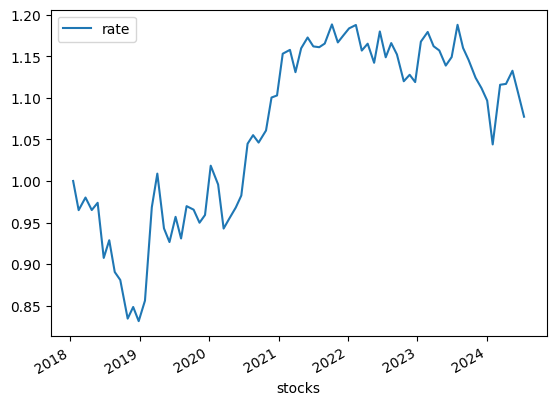

In [840]:
#数值
temp = pd.DataFrame(1+model_profit2)
# temp.index = pd.to_datetime(temp.index)
temp.cumprod().plot()
print(f'mean return{model_profit2.mean()}')
print(f'annual_ret{model_profit2.mean()*12}')
print(f'SR{(model_profit2.mean()*12)/(model_profit2.std()*np.sqrt(12))}')

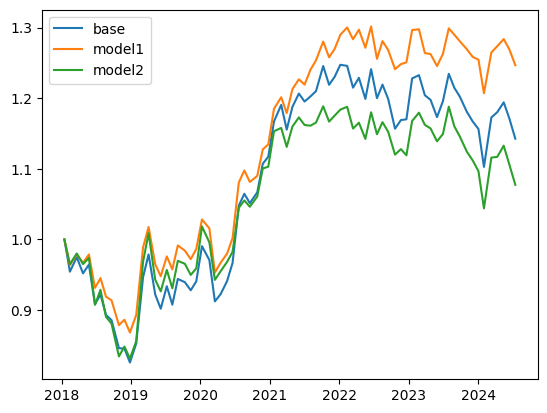

In [865]:
#对比图
temp = pd.DataFrame(1 + model_profit)
dates = temp.index
temp1 = pd.DataFrame(1 + model_profit1)
temp2 = pd.DataFrame(1 + model_profit2)
temp = temp.cumprod()
temp1 = temp1.cumprod()
temp2 = temp2.cumprod()
dates = temp1.index
plt.plot(dates, temp, label='base', linestyle='-', marker=None)
plt.plot(dates, temp1, label='model1', linestyle='-', marker=None)
plt.plot(dates, temp2, label='model2', linestyle='-', marker=None)
plt.legend()

In [859]:
#4 残差动量+信号风险预算资产权重分配方式2

In [771]:
#5 风格趋势+信号风险预算资产权重分配方式2

In [772]:
#注意
#先运行df,df_re
#每次运行重新temp,factors